# Big Data for Biologists: Decoding Genomic Function- Class 8

## How can you learn about the function of a gene product by studying other organisms?  

##  Learning Objectives
***Students should be able to***
 <ol> 
 <li> <a href=#KmeansGenes> Apply k-means clustering to identify and plot groups of genes with similar function in a set of differentiallly expressed genes.</a> </li>
 <li> <a href=#head> Use the Unix command head to view the top lines in a file.</a> </li>
 <li> <a href=#catwc> Use the Unix commands cat and wc to count the lines in a file.</a> </li>
 <li> <a href=#GOtermIntro> Describe how the Gene Ontology is organized and what a "GO term" means. </a> </li>
 <li> <a href=#GOtermenrichment> Explain what GO term enrichment is </a></li>
 <li> <a href=#GeneIDtoName> Convert GeneIDs to GeneNames </a></li>
 <li> <a href=#GOrilla> Use the GOrilla website to identify GOterms enriched in a set of genes </a></li>

In [4]:
# magic! (don't worry about this)
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt

import sys
sys.path.append('../helpers')
from kmeans_helpers import * 
from RNAseq_helpers import * 

## K-means clustering as a method to identify groups of related genes<a name='KmeansGenes' />

In the previous tutorial, we performed k-means clustering to group gene expression samples by organ system. 

Now, we are interested in identifying groups of genes with similar patterns of expression across organ systems. 

Previously, we performed k-means clustering on the samples. Now, to perfom clustering on the genes, we will reverse the axis (ie. switch the rows and columns) in the data set that we input for the kmeans analysis. 

Let's begin with 4 clusters (k=4). 

In [5]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples

In [29]:
import pandas as pd 
systems_subset=["Blood","Embryonic","Immune","Respiratory"]
data,batches=load_rnaseq_data(systems_subset=systems_subset,filepath='../datasets/RNAseq/diff_genes/diff_genes_top.tsv',batches='../datasets/RNAseq/rnaseq_batches.txt')
print(data.shape)

(1543, 116)


In the previous two tutorials, when we read in our dataset, we used a command data.transpose to put the sample names as the rows and the genes as the columns. 

For this tutorial we want to keep the gene names as the rows and have the sample names as the column. 

From the output of the command data.shape you can see that there are now 1543 rows (which corresponds to the number of genes) and 116 columns (corresponding to the number of samples).  

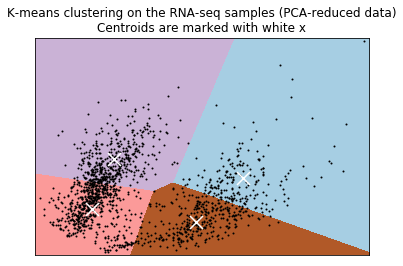

For n_clusters = 4 The average silhouette_score is : 0.439181099491


In [7]:
k=4
clusters=scikit_kmeans(data,k)

In [15]:
#To see what the output of the kmeans clustering looks like, print the first ten lines
print(clusters[0:10])

[0 2 0 0 3 3 3 0 3 0]


In [8]:
#sort the data by cluster assignment 
#Add a column to the data frame containing the cluster assignments 
data['Clusters']=clusters
#Sort the data by the Clusters column 
data=(data.sort_values(by=list(data.columns),axis=0)).sort_values(by="Clusters",axis=0)

In [16]:
plot_heatmap_genes(data,batches)

We now obtain the list of genes associated with each cluster using the '**get_genes_from_cluster**' function in **../helpers/kmeans_helpers.py**

In [13]:
get_genes_from_clusters(data,clusters,k,filename='differential_gene_id_to_gene_name.txt')

This will generate files 0.txt, 1.txt, 2.txt, and 3.txt -- listing the genes associated with each cluster. 



## How can I use the Unix command head to view  the lines in a file.<a name='head' />

Rather than writing the code to read one of these files into Python, we are going to quickly view them using the Unix command "head". 

Remember from class one that in Jupyter notebooks you can use an ! to use Unix commands from a Python shell. 

In [14]:
#Examine the first 10 lines in the file 0.txt
! head 0.txt

AKR1C3
PROM1
C3
PAK6
TENM3
GPRC5A
GLI2
IGHV1-2
TMEFF1
GPR37


## How can I use the Unix commands cat and wc to count the lines in a file. <a name='catwc' />

 We can also use Unix commands to quickly count the lines in a file. 

cat= concatenate
wc= word count
| takes the output of the command before the | and uses it as input for what comes after the |. 


In the command below, cat 0.txt displays the output of 0.txt. 
| tells the program to take the output of cat 0.txt and use it as the input for the wc -l command. 
The wc -l command prints the number of lines 

In [15]:
#Count the number of genes in each cluster 
#Cluster 0 
!cat 0.txt | wc -l 

     498


In [16]:
!cat 1.txt | wc -l 

     277


In [17]:
!cat 2.txt | wc -l 


     172


In [18]:
!cat 3.txt | wc -l

     391


## How is the gene ontology organized and what is a GO term? <a name='GOtermIntro' />

[The Gene Onotology](http://www.geneontology.org/)  provides controlled vocabularies of defined terms representing gene product properties. These cover three domains: 

* **Cellular Component**, the parts of a cell or its extracellular environment; 
* **Molecular Function**, the elemental activities of a gene product at the molecular level, such as binding or catalysis;
* **Biological Process**, operations or sets of molecular events with a defined beginning and end, pertinent to the functioning of integrated living units: cells, tissues, organs, and organisms.

The GO ontology is structured as a directed acyclic graph where each term has defined relationships to one or more other terms in the same domain, and sometimes to other domains. The GO vocabulary is designed to be species-agnostic, and includes terms applicable to prokaryotes and eukaryotes, and single and multicellular organisms.

In an example of GO annotation, the gene product "cytochrome c" can be described by the Molecular Function term "oxidoreductase activity", the Biological Process terms "oxidative phosphorylation" and "induction of cell death", and the Cellular Component terms "mitochondrial matrix" and "mitochondrial inner membrane".

Gene Ontology terms are organized in a hierarchy of 7 levels. The structure of GO can be described in terms of a graph, where each GO term is a node, and the relationships between the terms are edges between the nodes. GO is loosely hierarchical, with 'child' terms being more specialized than their 'parent' terms, but unlike a strict hierarchy, a term may have more than one parent term (note that the parent/child model does not hold true for all types of relation, see the relations documentation). For example, the biological process term hexose biosynthetic process has two parents, hexose metabolic process and monosaccharide biosynthetic process. This is because biosynthetic process is a subtype of metabolic process and a hexose is a subtype of monosaccharide.

The following diagram is a screenshot from the [gene ontology consortium](http://geneontology.org/page/ontology-structure), showing a small set of terms from the ontology. 

![GO example](go_example.png)


## What is GO term enrichment?  <a name='GOtermenrichment' />

[GOrilla](http://cbl-gorilla.cs.technion.ac.il/) is a tool for identifying and visualizing enriched GO terms in ranked lists of genes.
It can be run in one of two modes:

*    Searching for enriched GO terms that appear densely at the top of a ranked list of genes or
*    Searching for enriched GO terms in a target list of genes compared to a background list of genes. We will use this mode to identify GO terms that are enriched in the set of 1543 differential genes identified in our four tissues of interest, compared with the background of all genes in the hg19 reference genome. 


First, we will run all 1543 differentially expressed genes through GORilla to determine if there are any significantly enriched GO terms as compared to the background of all genes in the hg19 reference genome. Write the differential genes to an output file called 'differential_gene_ids.txt'. The file 'hg19.txt' contains a list of all gene id's and gene names in the hg19 reference genome.  


In [34]:
gene_ids=data.index
gene_ids[0:10]

Index(['ENSG00000269416.1', 'ENSG00000008517.12', 'ENSG00000158966.9',
       'ENSG00000167768.4', 'ENSG00000147257.9', 'ENSG00000169992.5',
       'ENSG00000143248.8', 'ENSG00000232301.1', 'ENSG00000083857.9',
       'ENSG00000165272.10'],
      dtype='object')

In [21]:
outf=open('differential_gene_ids.txt','w')
outf.write('\n'.join(gene_ids))

28316

In [22]:
!head differential_gene_ids.txt


ENSG00000269416.1
ENSG00000008517.12
ENSG00000158966.9
ENSG00000167768.4
ENSG00000147257.9
ENSG00000169992.5
ENSG00000143248.8
ENSG00000232301.1
ENSG00000083857.9
ENSG00000165272.10


## Convert GeneIDs to Gene Names <a name='GeneIDtoName' />

GOrilla expects gene names, rather than gene id's as the input, so we must convert from the ENSEMBL id's to the official gene symbols. 

It looks like GOrilla is not able to recognize the ENSEMBL gene id's. We must convert them to the official gene symbol format. The code below will perform this conversion. 

In [23]:
#The file "gene_id_to_gene_name.txt" maps gene id's to gene names. Examine the contents of this file: 
!head differential_gene_id_to_gene_name.txt


ENSG00000269416.1	CTB-175P5.4
ENSG00000008517.12	IL32
ENSG00000158966.9	CACHD1
ENSG00000167768.4	KRT1
ENSG00000147257.9	GPC3
ENSG00000169992.5	NLGN2
ENSG00000143248.8	RGS5
ENSG00000232301.1	RP11-132A1.3
ENSG00000083857.9	FAT1
ENSG00000165272.10	AQP3


In [11]:
#We iterate through the gene id's in our list and find the corresponding gene names. 
!grep -f differential_gene_ids.txt differential_gene_id_to_gene_name.txt | cut -f2 > differential_gene_names.txt
!head -n10 differential_gene_names.txt

CTB-175P5.4
IL32
CACHD1
KRT1
GPC3
NLGN2
RGS5
RP11-132A1.3
FAT1
AQP3


In [15]:
# cut the second column from the file hg19.txt to get the names (rather than ENSEMBL id's) of all genes in hg19. 
#! cut -f2 hg19.txt >  hg19.names.txt 
!head -n10 hg19.names.txt

RP11-368I23.2
RP11-167B3.1
RP11-742D12.2
RAB4B
AC104071.1
TIGAR
LINC01224
MIR4802
NUP210P2
DNAH3


## Use the GOrilla website to identify GOterms enriched in a set of genes <a name='GOrilla' />

We are now ready to use GOrilla to check for enriched GO terms. 

You can accesss GOrilla from the notebook box below, but may find it helpful to open up a new web-browser window at this [link](http://cbl-gorilla.cs.technion.ac.il/).

Follow these steps in the GOrilla portal: 
* select "Homo sapiens" for "Choose organism" 
* Select "Two unranked lists of genes" from "Choose running mode" 
* Upload the file "differential_genes_names.txt" for the Target set. 
* Upload the file "hg19.names.txt" for the Background set. 
* Select "All" under "Choose an ontology". 
* Click on "Search Enriched GO terms"  
* Examine the output by clicking on "Process", "Function", and "Cellular Component" tabs.  

 

In [16]:
from IPython.display import IFrame

IFrame('http://cbl-gorilla.cs.technion.ac.il/',height=1000,width=1000)

The top 5 hits for Process should be: 
![Process](process_go_allgenes.update.png)
The top 5 hits for Function should be: 
![Function](function_go_allgenes.update.png)
The top 5 hits for Cellular Component should be: 
![Cellular Component](component_go_allgenes.png)


GOrilla also generates the graph of inter-related GO terms, color-coding them by significance.

Re-run the GORilla analysis with each cluster of genes (upload 0.txt, 1.txt, 2.txt, and 3.txt to GORilla to compare the significant Process, Function, and Cellular Component GO terms that are returned.)

## Cluster 0 
From the heatmap, Cluster 0 appears to contain genes that are downregulated in Blood and up-regulated in Embryonic cells. 

### Process: 
![0_process](0.process.png)
### Function: 
![0_function](0.function.png)
### Cellular Component:
![0_component](0.component.png)

## Cluster 1 
From the heatmap, Cluster 1 contains genes that are moderately upregulated in Blood and the Immune system. 

### Process: 
![1.process](1.process.png)
### Function: 
![1.function](1.function.png)
### Cellular Component:
![1.component](1.component.png)

## Cluster 2 
From the heatmap, Cluster 2 contains genes that are strongly upregulated in Blood and the Immune system. 


### Process: 
![2.process](2.process.png)
### Function: 
![2.function](2.function.png) 
#### Cellular Component:
![2.component](2.component.png) 

## Cluster 3

From the heatmap, cluster 3 contains genes that are upregulated in the Respiratory system and Embryonic samples. 

### Process: 
![3.process](3.process.png) 
#### Function: 
![3.function](3.function.png) 
#### Cellular Component:
![3.component](3.component.png)


Web-based tools such as GOrilla are convenient to use for small numbers of queries. However, you may often perform a more complex analysis with dozens of clusters instead of just 4, as we have here. 

For more complex analysis with more clusters, GO queries can be done programatically with the goatools python library. 
